<a href="https://colab.research.google.com/github/Ysagar-hub/Crop-Plantation-Stage/blob/main/khagariafull.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
!pip install shapely -q
!ls
!python batch_fetch_boundaries.py village_codes_test3.csv results.jsonl

with open('results.jsonl') as f:
    for line in f:
        print(line)


batch_fetch_boundaries.py      sample_data
bhunaksha_api_client.py        test_output_plots.geojson
DCS_BhuNaksha_All_050826.xlsx  village_codes_test3.csv
results.jsonl
2026-08-07 10:41:07,325 [INFO] Loaded 3 villages, 3 already fetched previously.
2026-08-07 10:41:07,325 [INFO] Batch run complete.
{"lgd_village_code": "238540", "map_type": "CS", "sheet_no": "00", "geometry": {"type": "FeatureCollection", "features": [{"type": "Feature", "properties": {"the_geom": "MULTIPOLYGON (((443804.5484050849 2829393.0573636238, 443799.6362765025 2829360.0112338327, 443786.55693231 2829282.451504376, 443772.77798570495 2829200.220078811, 443764.13144501916 2829095.596829081, 443754.0886999207 2829026.7363409083, 443744.51974901615 2828944.0624978766, 443737.515753911 2828869.5687241703, 443738.4614625204 2828845.6688732393, 443751.54689791345 2828795.6830257718, 443777.0009771717 2828714.209390614, 443795.2191980543 2828660.492485795, 443814.8328822829 2828608.6140634753, 443834.6860031149 282856

In [13]:
!pip install shapely pyproj geopandas matplotlib -q

# Step 1: fetch the 3 test villages
!python batch_fetch_boundaries.py village_codes_test3.csv results.jsonl

# Step 2: convert raw responses to plot-level GeoJSON
!python convert_to_geojson(1).py results.jsonl output

# Step 3: convert GeoJSON to Shapefile (+ GeoPackage)
!python geojson_to_shp.py output.geojson final_output --formats shp gpkg

# Step 4: load the shapefile back and plot it inline, right here in Colab
import geopandas as gpd
import matplotlib.pyplot as plt

gdf = gpd.read_file('final_output.shp')
print(f"Loaded {len(gdf)} plots from final_output.shp")
print(gdf.head())

fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(
    ax=ax,
    column='lgd_villa',   # truncated field name -- shapefile caps at 10 chars
    categorical=True,
    legend=True,
    edgecolor='black',
    linewidth=0.2,
)
ax.set_title(f"{len(gdf)} plots across {gdf['lgd_villa'].nunique()} villages")
plt.show()

2026-08-07 11:42:46,288 [INFO] Loaded 3 villages, 3 already fetched previously.
2026-08-07 11:42:46,288 [INFO] Batch run complete.
/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `python convert_to_geojson(1).py results.jsonl output'
Reading output.geojson ...
Traceback (most recent call last):
  File "/content/geojson_to_shp.py", line 58, in <module>
    main()
  File "/content/geojson_to_shp.py", line 40, in main
    gdf = gpd.read_file(args.input_geojson)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/geopandas/io/file.py", line 316, in _read_file
    return _read_file_pyogrio(
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/geopandas/io/file.py", line 576, in _read_file_pyogrio
    return pyogrio.read_dataframe(path_or_bytes, bbox=bbox, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pyogrio/

DataSourceError: final_output.shp: No such file or directory

=== Fetching villages ===
[token] generated, valid until 12:16:37
fetched village 238540
fetched village 238541
fetched village 238542

=== Converting to GeoJSON ===
Wrote 5347 plot features -> final_output.geojson

=== Converting to Shapefile/GeoPackage ===
Loaded 5347 features. CRS: EPSG:4326
Wrote Shapefile -> final_output.shp


/tmp/ipykernel_2335/220501315.py:191: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(shp_path, driver="ESRI Shapefile")
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:733: RuntimeWarning: Normalized/laundered field name: 'lgd_village_code' to 'lgd_villag'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:733: RuntimeWarning: Normalized/laundered field name: 'plot_sheetno' to 'plot_sheet'
  ogr_write(


Wrote GeoPackage -> final_output.gpkg
NOTE: field names truncated by Shapefile's 10-char limit: ['lgd_village_code', 'plot_sheetno']

=== Plotting ===


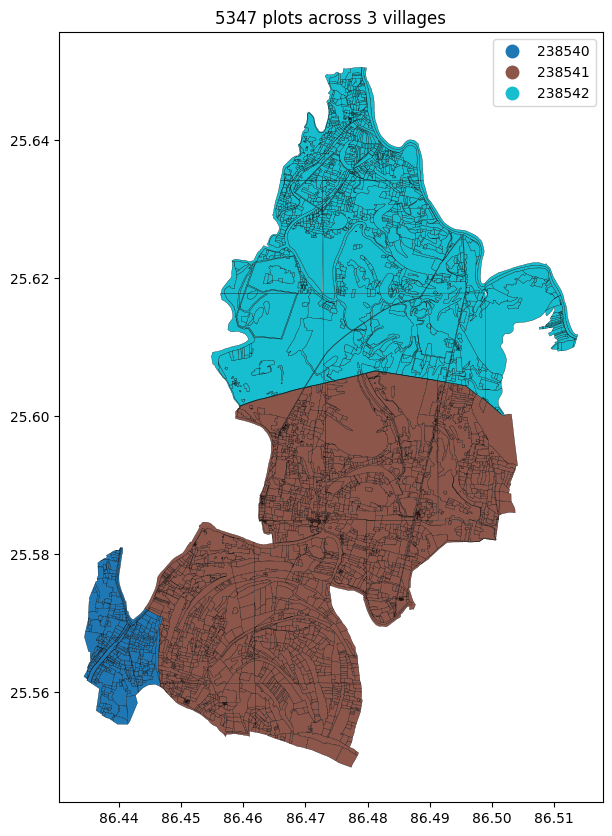

In [14]:
"""
Full self-contained Bhu-naksha pipeline for Google Colab
-------------------------------------------------------------
Everything in one script -- no separate .py files to upload, so no
missing-file or renamed-file issues. Just paste this whole thing into
one Colab cell and run it.

What it does, in order:
  1. Installs dependencies
  2. Defines the token-managed API client (auto-refreshes every 30 min)
  3. Fetches 3 test villages (change VILLAGE_CODES below for more)
  4. Converts the raw responses into plot-level GeoJSON (WKT -> GeoJSON,
     UTM45N -> WGS84 reprojection)
  5. Converts that GeoJSON into Shapefile + GeoPackage
  6. Loads the shapefile back and plots it inline, right in Colab output
"""

# ============================================================
# 0. INSTALL DEPENDENCIES
# ============================================================
import subprocess
subprocess.run(["pip", "install", "-q", "requests", "shapely", "pyproj", "geopandas", "matplotlib"], check=True)

import requests
import time
import json
from datetime import datetime, timedelta

from shapely import wkt as shapely_wkt
from shapely.geometry import mapping
from shapely.ops import transform
from pyproj import Transformer

import geopandas as gpd
import matplotlib.pyplot as plt


# ============================================================
# 1. CONFIG -- edit these
# ============================================================
STATE_CODE = "10"  # Bihar
VILLAGE_CODES = [
    # (lgd_village_code, map_type, sheet_no)
    ("238540", "CS", "00"),
    ("238541", "CS", "00"),
    ("238542", "CS", "00"),
]
SOURCE_EPSG = 32645  # UTM Zone 45N -- confirmed correct for Bihar
OUTPUT_NAME = "final_output"  # -> final_output.geojson / .shp / .gpkg


# ============================================================
# 2. TOKEN-MANAGED API CLIENT
# ============================================================
BASE_URL = "https://bhunaksha.bihar.gov.in/rest/GetMapInstanceMap"
GENERATE_TOKEN_URL = f"{BASE_URL}/generateToken"
GET_GEOM_URL = f"{BASE_URL}/getGeom"
DEFAULT_TOKEN_LIFETIME_MINUTES = 30
SAFETY_MARGIN_SECONDS = 60


class BhunakshaClient:
    def __init__(self):
        self.token = None
        self.token_expiry = None

    def _parse_expiry(self, expires_in_str, generated_at):
        try:
            value, unit = expires_in_str.strip().split()
            value = int(value)
            unit = unit.lower()
            if "minute" in unit:
                delta = timedelta(minutes=value)
            elif "second" in unit:
                delta = timedelta(seconds=value)
            elif "hour" in unit:
                delta = timedelta(hours=value)
            else:
                delta = timedelta(minutes=DEFAULT_TOKEN_LIFETIME_MINUTES)
        except Exception:
            delta = timedelta(minutes=DEFAULT_TOKEN_LIFETIME_MINUTES)
        return generated_at + delta - timedelta(seconds=SAFETY_MARGIN_SECONDS)

    def generate_token(self):
        generated_at = datetime.now()
        response = requests.post(GENERATE_TOKEN_URL, timeout=15)
        response.raise_for_status()
        data = response.json()
        if not data.get("success"):
            raise RuntimeError(f"Token generation failed: {data}")
        self.token = data["token"]
        self.token_expiry = self._parse_expiry(
            data.get("expiresIn", f"{DEFAULT_TOKEN_LIFETIME_MINUTES} minutes"), generated_at
        )
        print(f"[token] generated, valid until {self.token_expiry.strftime('%H:%M:%S')}")
        return self.token

    def _ensure_valid_token(self):
        if self.token is None or self.token_expiry is None or datetime.now() >= self.token_expiry:
            self.generate_token()

    def get_geom(self, state, lgd_village_code, map_type, sheet_no, retry_on_auth_fail=True):
        self._ensure_valid_token()
        payload = {
            "state": state,
            "lgdVillageCode": lgd_village_code,
            "mapType": map_type,
            "sheetNo": sheet_no,
            "token": self.token,
        }
        headers = {"Content-Type": "application/x-www-form-urlencoded"}
        response = requests.post(GET_GEOM_URL, data=payload, headers=headers, timeout=15)
        if response.status_code in (401, 403) and retry_on_auth_fail:
            print("[getGeom] auth failed, refreshing token and retrying once...")
            self.generate_token()
            payload["token"] = self.token
            response = requests.post(GET_GEOM_URL, data=payload, headers=headers, timeout=15)
        response.raise_for_status()
        return response.json()


# ============================================================
# 3. FETCH VILLAGES
# ============================================================
print("=== Fetching villages ===")
client = BhunakshaClient()
raw_results = []  # list of (village_code, map_type, sheet_no, response_json)

for village_code, map_type, sheet_no in VILLAGE_CODES:
    try:
        geom = client.get_geom(STATE_CODE, village_code, map_type, sheet_no)
        raw_results.append((village_code, map_type, sheet_no, geom))
        print(f"fetched village {village_code}")
    except Exception as e:
        print(f"FAILED village {village_code}: {e}")
    time.sleep(1)


# ============================================================
# 4. CONVERT TO PLOT-LEVEL GEOJSON (WKT -> GeoJSON, UTM -> WGS84)
# ============================================================
print("\n=== Converting to GeoJSON ===")
transformer = Transformer.from_crs(f"EPSG:{SOURCE_EPSG}", "EPSG:4326", always_xy=True)

def reproject_geom(geom):
    return transform(lambda x, y, z=None: transformer.transform(x, y), geom)

plot_features = []
for village_code, map_type, sheet_no, response in raw_results:
    features = (response or {}).get("features", [])
    for feat in features:
        props = feat.get("properties", {})
        wkt_str = props.get("the_geom")
        if not wkt_str:
            continue
        try:
            geom = shapely_wkt.loads(wkt_str)
            geom_wgs84 = reproject_geom(geom)
        except Exception as e:
            print(f"parse/reproject failed for village {village_code}: {e}")
            continue
        plot_features.append({
            "type": "Feature",
            "geometry": mapping(geom_wgs84),
            "properties": {
                "lgd_village_code": village_code,
                "map_type": map_type,
                "sheet_no": sheet_no,
                "kide": props.get("kide"),
                "area_acres": props.get("area_acres"),
                "dist_lgd": props.get("dist_lgd"),
                "circle_lgd": props.get("circle_lgd"),
                "plot_sheetno": props.get("sheetno"),
            },
        })

geojson_path = f"{OUTPUT_NAME}.geojson"
with open(geojson_path, "w", encoding="utf-8") as f:
    json.dump({"type": "FeatureCollection", "features": plot_features}, f)
print(f"Wrote {len(plot_features)} plot features -> {geojson_path}")


# ============================================================
# 5. CONVERT TO SHAPEFILE + GEOPACKAGE
# ============================================================
print("\n=== Converting to Shapefile/GeoPackage ===")
gdf = gpd.read_file(geojson_path)
print(f"Loaded {len(gdf)} features. CRS: {gdf.crs}")

shp_path = f"{OUTPUT_NAME}.shp"
gdf.to_file(shp_path, driver="ESRI Shapefile")
print(f"Wrote Shapefile -> {shp_path}")

gpkg_path = f"{OUTPUT_NAME}.gpkg"
gdf.to_file(gpkg_path, driver="GPKG")
print(f"Wrote GeoPackage -> {gpkg_path}")

long_fields = [c for c in gdf.columns if len(c) > 10 and c != "geometry"]
if long_fields:
    print(f"NOTE: field names truncated by Shapefile's 10-char limit: {long_fields}")


# ============================================================
# 6. LOAD SHAPEFILE BACK AND PLOT INLINE
# ============================================================
print("\n=== Plotting ===")
gdf_shp = gpd.read_file(shp_path)
village_field = [c for c in gdf_shp.columns if c.startswith("lgd_villa")][0]

fig, ax = plt.subplots(figsize=(10, 10))
gdf_shp.plot(
    ax=ax,
    column=village_field,
    categorical=True,
    legend=True,
    edgecolor="black",
    linewidth=0.2,
)
ax.set_title(f"{len(gdf_shp)} plots across {gdf_shp[village_field].nunique()} villages")
plt.show()

=== Fetching all Khagaria villages ===
Loaded 299 villages from village_codes_Khagaria.csv
[token] generated, valid until 12:22:01
[1/299] fetched village 238540
[2/299] fetched village 238541
[3/299] fetched village 238542
[4/299] fetched village 238543
[5/299] fetched village 238544
[6/299] fetched village 238545
[7/299] fetched village 238546
[8/299] fetched village 238547
[9/299] fetched village 238548
[10/299] fetched village 238549
[11/299] fetched village 238550
[12/299] fetched village 238551
[13/299] fetched village 238552
[14/299] fetched village 238553
[15/299] fetched village 238554
[16/299] fetched village 238555
[17/299] fetched village 238556
[18/299] fetched village 238557
[19/299] fetched village 238558
[20/299] fetched village 238559
[21/299] fetched village 238560
[22/299] fetched village 238561
[23/299] fetched village 238562
[24/299] fetched village 238563
[25/299] fetched village 238564
[26/299] fetched village 238565
[27/299] fetched village 238566
[28/299] fetch

/tmp/ipykernel_2335/1993488719.py:247: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(shp_path, driver="ESRI Shapefile")
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:733: RuntimeWarning: Normalized/laundered field name: 'lgd_village_code' to 'lgd_villag'
  ogr_write(
/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:733: RuntimeWarning: Normalized/laundered field name: 'plot_sheetno' to 'plot_sheet'
  ogr_write(


Wrote Shapefile -> khagaria_full.shp
Wrote GeoPackage -> khagaria_full.gpkg

=== Plotting ===


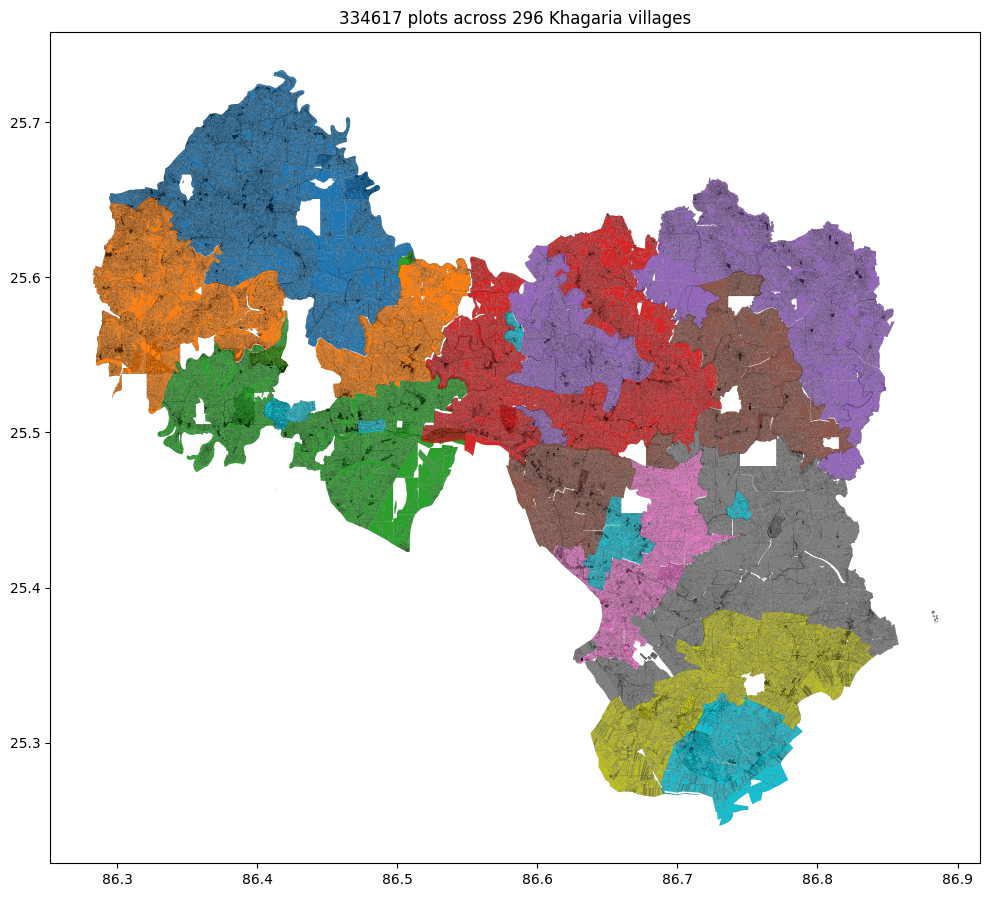

In [15]:
"""
Full self-contained Bhu-naksha pipeline for ALL Khagaria villages
------------------------------------------------------------------------
Paste this whole thing into one Colab cell and run it.
Requires ONE uploaded file: village_codes_Khagaria.csv (299 villages)

What it does, in order:
  1. Installs dependencies
  2. Defines the token-managed API client (auto-refreshes every 30 min)
  3. Fetches ALL 299 Khagaria villages from village_codes_Khagaria.csv,
     saving incrementally to results_khagaria.jsonl (crash-safe -- if
     interrupted, just re-run and it skips villages already fetched)
  4. Converts the raw responses into plot-level GeoJSON (WKT -> GeoJSON,
     UTM45N -> WGS84 reprojection)
  5. Converts that GeoJSON into Shapefile + GeoPackage
  6. Loads the shapefile back and plots it inline, right in Colab output

NOTE ON RUNTIME: 299 villages at ~1 second/call is roughly 5-6 minutes
just for the fetch step, plus conversion time. This is much bigger than
the earlier 3-village test -- expect several hundred thousand individual
plot features in total (the 3-village test alone produced 5,347 plots
across just 3 villages).
"""

# ============================================================
# 0. INSTALL DEPENDENCIES
# ============================================================
import subprocess
subprocess.run(["pip", "install", "-q", "requests", "shapely", "pyproj", "geopandas", "matplotlib"], check=True)

import requests
import time
import json
import csv
import os
from datetime import datetime, timedelta

from shapely import wkt as shapely_wkt
from shapely.geometry import mapping
from shapely.ops import transform
from pyproj import Transformer

import geopandas as gpd
import matplotlib.pyplot as plt


# ============================================================
# 1. CONFIG
# ============================================================
STATE_CODE = "10"  # Bihar
VILLAGE_CSV = "village_codes_Khagaria.csv"   # upload this file into Colab first
SOURCE_EPSG = 32645  # UTM Zone 45N -- confirmed correct for Bihar
OUTPUT_NAME = "khagaria_full"  # -> khagaria_full.geojson / .shp / .gpkg
RESULTS_JSONL = "results_khagaria.jsonl"
DELAY_BETWEEN_CALLS_SECONDS = 1.0


# ============================================================
# 2. TOKEN-MANAGED API CLIENT
# ============================================================
BASE_URL = "https://bhunaksha.bihar.gov.in/rest/GetMapInstanceMap"
GENERATE_TOKEN_URL = f"{BASE_URL}/generateToken"
GET_GEOM_URL = f"{BASE_URL}/getGeom"
DEFAULT_TOKEN_LIFETIME_MINUTES = 30
SAFETY_MARGIN_SECONDS = 60


class BhunakshaClient:
    def __init__(self):
        self.token = None
        self.token_expiry = None

    def _parse_expiry(self, expires_in_str, generated_at):
        try:
            value, unit = expires_in_str.strip().split()
            value = int(value)
            unit = unit.lower()
            if "minute" in unit:
                delta = timedelta(minutes=value)
            elif "second" in unit:
                delta = timedelta(seconds=value)
            elif "hour" in unit:
                delta = timedelta(hours=value)
            else:
                delta = timedelta(minutes=DEFAULT_TOKEN_LIFETIME_MINUTES)
        except Exception:
            delta = timedelta(minutes=DEFAULT_TOKEN_LIFETIME_MINUTES)
        return generated_at + delta - timedelta(seconds=SAFETY_MARGIN_SECONDS)

    def generate_token(self):
        generated_at = datetime.now()
        response = requests.post(GENERATE_TOKEN_URL, timeout=15)
        response.raise_for_status()
        data = response.json()
        if not data.get("success"):
            raise RuntimeError(f"Token generation failed: {data}")
        self.token = data["token"]
        self.token_expiry = self._parse_expiry(
            data.get("expiresIn", f"{DEFAULT_TOKEN_LIFETIME_MINUTES} minutes"), generated_at
        )
        print(f"[token] generated, valid until {self.token_expiry.strftime('%H:%M:%S')}")
        return self.token

    def _ensure_valid_token(self):
        if self.token is None or self.token_expiry is None or datetime.now() >= self.token_expiry:
            self.generate_token()

    def get_geom(self, state, lgd_village_code, map_type, sheet_no, retry_on_auth_fail=True):
        self._ensure_valid_token()
        payload = {
            "state": state,
            "lgdVillageCode": lgd_village_code,
            "mapType": map_type,
            "sheetNo": sheet_no,
            "token": self.token,
        }
        headers = {"Content-Type": "application/x-www-form-urlencoded"}
        response = requests.post(GET_GEOM_URL, data=payload, headers=headers, timeout=15)
        if response.status_code in (401, 403) and retry_on_auth_fail:
            print("[getGeom] auth failed, refreshing token and retrying once...")
            self.generate_token()
            payload["token"] = self.token
            response = requests.post(GET_GEOM_URL, data=payload, headers=headers, timeout=15)
        response.raise_for_status()
        return response.json()


# ============================================================
# 3. FETCH ALL KHAGARIA VILLAGES (crash-safe, resumable)
# ============================================================
print("=== Fetching all Khagaria villages ===")

if not os.path.exists(VILLAGE_CSV):
    raise FileNotFoundError(f"{VILLAGE_CSV} not found -- upload it to this Colab session first.")

with open(VILLAGE_CSV, newline="", encoding="utf-8") as f:
    village_rows = list(csv.DictReader(f))
print(f"Loaded {len(village_rows)} villages from {VILLAGE_CSV}")

already_done = set()
if os.path.exists(RESULTS_JSONL):
    with open(RESULTS_JSONL, "r", encoding="utf-8") as f:
        for line in f:
            try:
                already_done.add(json.loads(line)["lgd_village_code"])
            except Exception:
                continue
    print(f"{len(already_done)} villages already fetched in a previous run -- will skip those")

client = BhunakshaClient()

with open(RESULTS_JSONL, "a", encoding="utf-8") as out_f:
    for i, row in enumerate(village_rows, start=1):
        village_code = row["lgd_village_code"].strip()
        map_type = row.get("map_type", "CS").strip()
        sheet_no = row.get("sheet_no", "00").strip()

        if village_code in already_done:
            continue

        try:
            geom = client.get_geom(STATE_CODE, village_code, map_type, sheet_no)
            record = {
                "lgd_village_code": village_code,
                "map_type": map_type,
                "sheet_no": sheet_no,
                "geometry": geom,
            }
            out_f.write(json.dumps(record) + "\n")
            out_f.flush()
            print(f"[{i}/{len(village_rows)}] fetched village {village_code}")
        except Exception as e:
            print(f"[{i}/{len(village_rows)}] FAILED village {village_code}: {e}")

        time.sleep(DELAY_BETWEEN_CALLS_SECONDS)

print("Fetch complete.")


# ============================================================
# 4. CONVERT TO PLOT-LEVEL GEOJSON (WKT -> GeoJSON, UTM -> WGS84)
# ============================================================
print("\n=== Converting to GeoJSON ===")
transformer = Transformer.from_crs(f"EPSG:{SOURCE_EPSG}", "EPSG:4326", always_xy=True)

def reproject_geom(geom):
    return transform(lambda x, y, z=None: transformer.transform(x, y), geom)

plot_features = []
parse_failures = 0

with open(RESULTS_JSONL, "r", encoding="utf-8") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        record = json.loads(line)
        village_code = record["lgd_village_code"]
        map_type = record["map_type"]
        sheet_no = record["sheet_no"]
        response = record.get("geometry") or {}
        features = response.get("features", [])

        for feat in features:
            props = feat.get("properties", {})
            wkt_str = props.get("the_geom")
            if not wkt_str:
                parse_failures += 1
                continue
            try:
                geom = shapely_wkt.loads(wkt_str)
                geom_wgs84 = reproject_geom(geom)
            except Exception:
                parse_failures += 1
                continue
            plot_features.append({
                "type": "Feature",
                "geometry": mapping(geom_wgs84),
                "properties": {
                    "lgd_village_code": village_code,
                    "map_type": map_type,
                    "sheet_no": sheet_no,
                    "kide": props.get("kide"),
                    "area_acres": props.get("area_acres"),
                    "dist_lgd": props.get("dist_lgd"),
                    "circle_lgd": props.get("circle_lgd"),
                    "plot_sheetno": props.get("sheetno"),
                },
            })

geojson_path = f"{OUTPUT_NAME}.geojson"
with open(geojson_path, "w", encoding="utf-8") as f:
    json.dump({"type": "FeatureCollection", "features": plot_features}, f)
print(f"Wrote {len(plot_features)} plot features -> {geojson_path}")
if parse_failures:
    print(f"NOTE: {parse_failures} plot geometries could not be parsed")


# ============================================================
# 5. CONVERT TO SHAPEFILE + GEOPACKAGE
# ============================================================
print("\n=== Converting to Shapefile/GeoPackage ===")
gdf = gpd.read_file(geojson_path)
print(f"Loaded {len(gdf)} features. CRS: {gdf.crs}")

shp_path = f"{OUTPUT_NAME}.shp"
gdf.to_file(shp_path, driver="ESRI Shapefile")
print(f"Wrote Shapefile -> {shp_path}")

gpkg_path = f"{OUTPUT_NAME}.gpkg"
gdf.to_file(gpkg_path, driver="GPKG")
print(f"Wrote GeoPackage -> {gpkg_path}")


# ============================================================
# 6. LOAD SHAPEFILE BACK AND PLOT INLINE
# ============================================================
print("\n=== Plotting ===")
gdf_shp = gpd.read_file(shp_path)
village_field = [c for c in gdf_shp.columns if c.startswith("lgd_villa")][0]

fig, ax = plt.subplots(figsize=(12, 12))
gdf_shp.plot(
    ax=ax,
    column=village_field,
    categorical=True,
    legend=False,   # 299 villages would make the legend unreadable
    edgecolor="black",
    linewidth=0.05,
)
ax.set_title(f"{len(gdf_shp)} plots across {gdf_shp[village_field].nunique()} Khagaria villages")
plt.show()

In [16]:
!zip -r download_files.zip . -x "drive/*" "sample_data/*"

  adding: .config/ (stored 0%)
  adding: .config/.last_survey_prompt.yaml (stored 0%)
  adding: .config/.last_opt_in_prompt.yaml (stored 0%)
  adding: .config/gce (stored 0%)
  adding: .config/default_configs.db (deflated 98%)
  adding: .config/hidden_gcloud_config_universe_descriptor_data_cache_configs.db (deflated 97%)
  adding: .config/active_config (stored 0%)
  adding: .config/configurations/ (stored 0%)
  adding: .config/configurations/config_default (deflated 15%)
  adding: .config/logs/ (stored 0%)
  adding: .config/logs/2026.06.04/ (stored 0%)
  adding: .config/logs/2026.06.04/13.32.02.654775.log (deflated 58%)
  adding: .config/logs/2026.06.04/13.32.39.344962.log (deflated 57%)
  adding: .config/logs/2026.06.04/13.32.21.210570.log (deflated 58%)
  adding: .config/logs/2026.06.04/13.32.38.346437.log (deflated 57%)
  adding: .config/logs/2026.06.04/13.32.18.735754.log (deflated 86%)
  adding: .config/logs/2026.06.04/13.31.42.499627.log (deflated 92%)
  adding: .config/config_se